In [29]:
!pip install community

  Running setup.py bdist_wheel for community ... done
  Stored in directory: /home/ec2-user/.cache/pip/wheels/0d/7e/f9/089b3c72d33c16b8d3edb17f64291511e5eea08b80e419faa7
Successfully built community
You are using pip version 10.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [31]:
!pip install graph_tools

  Running setup.py bdist_wheel for pytess ... done
  Stored in directory: /home/ec2-user/.cache/pip/wheels/e6/a9/0c/deb8003b037eb99504cb256ea963c6880bafd36e4d0cce6ce0
Successfully built pytess
You are using pip version 10.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
#import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy import stats
import statsmodels.api as sm
from sklearn.metrics import accuracy_score
import seaborn as sns
import sys
from matplotlib import collections as mc
import networkx as nx
import nxpd as nxpd
import community as comm
import graph_tools as gt
from itertools import product

plt.style.use('ggplot')
%matplotlib inline

ModuleNotFoundError: No module named 'nxpd'

In [27]:
!pip install nxpd

  Using cached https://files.pythonhosted.org/packages/6a/fe/2ec17a6fbbff333db22a6ee84dbb2ba09ecb3ff111d37e7ff3aec69852a1/nxpd-0.2.0.tar.gz
  Running setup.py bdist_wheel for nxpd ... done
  Stored in directory: /home/ec2-user/.cache/pip/wheels/b9/0b/a2/ccdb5dd4ed0fce4220bbffbbd1683eed3468cfe2d266c78627
Successfully built nxpd
You are using pip version 10.0.1, however version 20.0.2 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
def preprocessing2(csv):
    df = pd.read_csv(csv)
    df = df.set_index('datetime')
    df = df.drop(['ip_ccount','doc_ccount', 'date', 'time', 'datetime.1'],axis=1)
    df['toDoc'] = df.groupby('ip')['accession'].shift(-1).fillna(0)
    return df

In [3]:
csv = '~/SageMaker/CreatingIPProfiles/df_filtered.csv'

In [4]:
df = preprocessing2(csv)

In [5]:
df.head()

,ip,accession,toDoc
datetime,,,
2010-10-10 00:02:06,151.191.175.eaj,0001045769-10-000006,0001193125-10-218728
2010-10-10 00:02:44,207.38.172.jde,0000950123-09-064496,0000892569-09-000610
2010-10-10 00:02:49,207.38.172.jde,0000892569-09-000610,0000892569-09-000610
2010-10-10 00:02:51,207.38.172.jde,0000892569-09-000610,0000892569-09-000610
2010-10-10 00:05:09,63.118.180.aji,0001047469-10-007200,0001193125-10-175291


In [6]:
def calc_spar(df):
    return np.sum(df)/np.prod(df.shape)

In [13]:
def sparsity_matrix(col1,col2):
    df_spar = pd.crosstab(col1, col2,dropna=False)
    drop_list =[]
    for x in df_spar.index.unique():
        if x not in df_spar.columns.unique():
            drop_list.append(x)
    return df_spar.drop(drop_list).drop(0, axis=1)

In [14]:
sparky = sparsity_matrix(df.accession, df.toDoc)

In [15]:
sparky.shape

(4333, 4333)

In [33]:
g_matrix = np.array(sparky)

In [34]:
features = sparky.columns

In [35]:
G = nx.Graph(g_matrix)

In [36]:
G.graph['rankdir'] = 'LR'

In [37]:
nxpd.draw(G, show='ipynb')

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.394683 to fit



In [38]:
between_ = nx.betweenness_centrality(G)

In [39]:
len(between_)

4333

In [40]:
d=nx.degree_centrality(G) 

In [41]:
degrees = nx.degree_centrality(G)

In [42]:
clustered = nx.clustering(G)

In [44]:
#eigen_cent = nx.eigenvector_centrality(G)

In [46]:
g_info = nx.info(G)

In [48]:
print(g_info)

Name: 
Type: Graph
Number of nodes: 4333
Number of edges: 7929
Average degree:   3.6598


/home/ec2-user/anaconda3/envs/chainer_p36/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:611: MatplotlibDeprecationWarning: isinstance(..., numbers.Number)
  if cb.is_numlike(alpha):


(-1.0951365423671173,
 0.9978673897094625,
 -0.9888916254043579,
 1.0714413166046142)

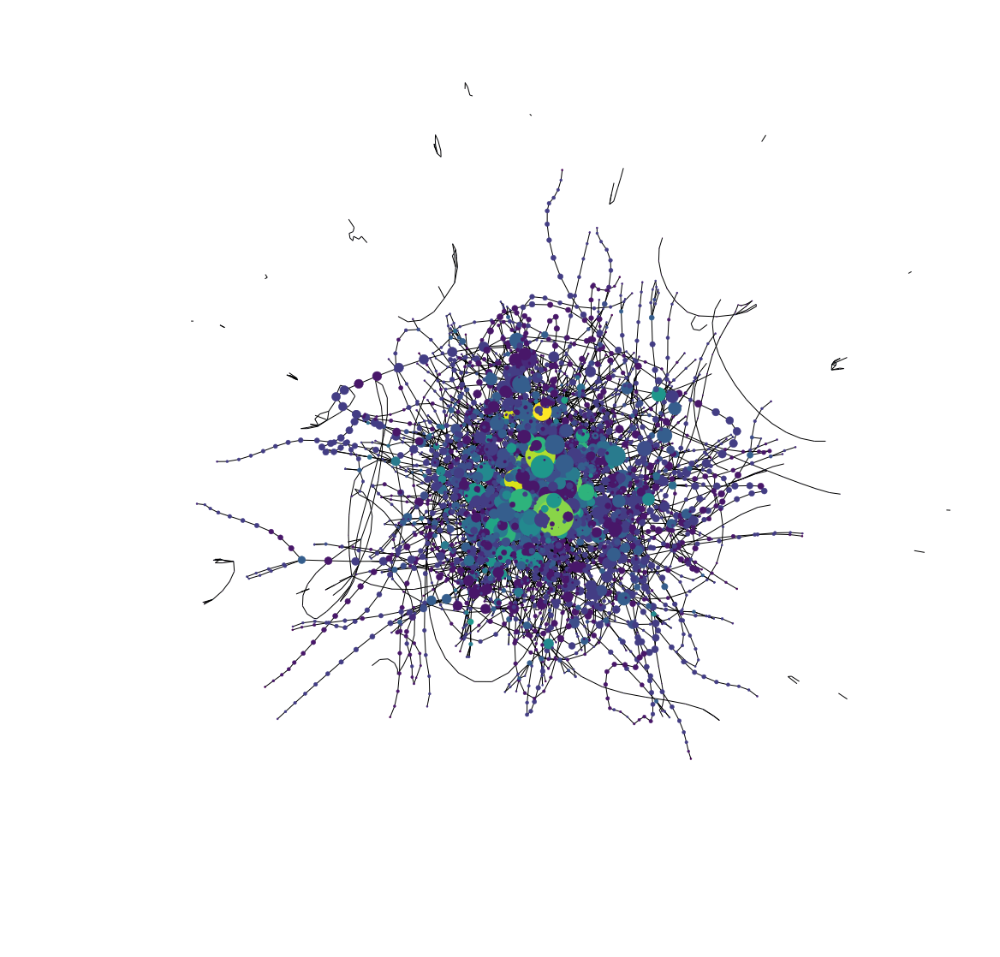

In [50]:
pos = nx.spring_layout(G)
betCent = nx.betweenness_centrality(G, normalized=True, endpoints=True)
node_color = [20000.0 * G.degree(v) for v in G]
node_size =  [v * 10000 for v in betCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos, with_labels=False,
                 node_color=node_color,
                 node_size=node_size )
plt.axis('off')

In [51]:
top5centrality = sorted(betCent, key=betCent.get, reverse=True)[:5]

In [52]:
print(features[top5centrality])

Index(['0001193125-10-225645', '0001193125-10-225018', '0001193125-10-213400',
       '0000950123-10-092199', '0000903423-10-000566'],
      dtype='object', name='toDoc')


In [3]:
#Applying Clustering
pos1 = nx.spring_layout(G)
clusCent = nx.clustering(G)
node_color = [20000.0 * G.degree(v) for v in G]
node_size =  [v * 10000 for v in clusCent.values()]
plt.figure(figsize=(20,20))
nx.draw_networkx(G, pos=pos1, with_labels=False,
                 node_color=node_color,
                 node_size=node_size )
plt.axis('off')

NameError: name 'G' is not defined